## Goal
#### Associated git sha of `vispz/numerai` github repo `11c74ffc`
In the notebook `task7b-ensembling-model-for-each-target`, we predicted using the models from each of the 36x3, `target x cv` split on the first half of the train+test split `test1`.  We will now use these prediction columns to and select the best target-models to ensemble on.


### Methodology
We will use 2 methods of feature selection

#### Previous notebook saved data format
  ``` python
  {
      "cv_predcols_map": [
          ["pred_arthur_v4_20_cv0", "pred_nomi_v4_20_cv0", ...],  # cv 0
          ["pred_arthur_v4_20_cv1", "pred_nomi_v4_20_cv1", ...],  # cv 1
          ["pred_arthur_v4_20_cv2", "pred_nomi_v4_20_cv2", ...],  # cv 2
      ],
      "cv_to_val_test_map": [
          # cv 0
          {"val": pd.DataFrame([era, features, pred_cols]),
           "test": pd.DataFrame([era, features])},
          {"val": DF, "test": DF},  # cv 1
          {"val": DF, "test": DF},  # cv 2
          
      ]
  }
  ```

In [158]:
%load_ext autoreload
%autoreload 2

from IPython.display import display, HTML, clear_output
display(HTML("<style>.container { width:100% !important; }</style>"))

from importlib import reload
import logging
reload(logging)
import logging
logging.basicConfig(level=logging.INFO)

import glob
import numpy as np
import datetime
import json
import os
import os.path
from os.path import join
import warnings
import flatdict
import pandas as pd
import itertools
import mlflow
import gc
import plotly.graph_objects as go
import functools
import matplotlib.pyplot as plt
import seaborn as sns
import plotly
import plotly.express as px
import plotly.colors
import plotly.offline as pyo
import itertools as it
from typing import List
import time
import copy
import cufflinks as cf


import utils as ut

from pprint import pprint, pformat
from tqdm.notebook import tqdm

from utils import ERA_COL, TARGET_COL


cf.go_offline()
pd.options.mode.chained_assignment = None  # default='warn'
# Filter the setuptools UserWarning until we stop relying on distutils
warnings.filterwarnings("ignore")
DF = pd.DataFrame
sns.set_theme()

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [115]:
pyo.init_notebook_mode()

## 1. Constants

In [3]:
LOCAL = True
if LOCAL:
    ML_TRACKING_SERVER_URI = "http://127.0.0.1:5000"
    AWS_CREDENTIALS_FILE = "~/.aws/personal_credentials"
else:
    ML_TRACKING_SERVER_URI = "http://18.218.213.146:5500/"
    AWS_CREDENTIALS_FILE = "~/.aws/credentials"
EXPERIMENT_NAME = f"ensemble_tgts_for_cyrus_2023-04-26_19h-36m"
DATA_PATH = "./data/"
VAL_PRED_S3_PATH = (
    "s3://numerai-v1/experiments/"
    "ensemble_tgts_for_cyrus_2023-04-26_19h-36m/"
    "ckpt1_cv_val_preds_no_feats.pkl"
)
ENSEMBLE_MODELS_S3_PATH = (
    "s3://numerai-v1/experiments/"
    "ensemble_tgts_for_cyrus_2023-04-26_19h-36m/"
    "ensemble_models/"
)

log = ut.Logger(root_dir="./")

EXPT_LOCAL_DIR = os.path.join(DATA_PATH, "experiments", EXPERIMENT_NAME)
MODEL_DIR = join(EXPT_LOCAL_DIR, "models")
for fld in [EXPT_LOCAL_DIR, MODEL_DIR]:
    os.makedirs(fld, exist_ok=True)
    log.info(f"Making {fld}")
    
log.info(f"{EXPERIMENT_NAME=}")
log.info(f"{VAL_PRED_S3_PATH=}")

[2023-04-30 18:35:32]  Making ./data/experiments/ensemble_tgts_for_cyrus_2023-04-26_19h-36m
[2023-04-30 18:35:32]  Making ./data/experiments/ensemble_tgts_for_cyrus_2023-04-26_19h-36m/models
[2023-04-30 18:35:32]  EXPERIMENT_NAME='ensemble_tgts_for_cyrus_2023-04-26_19h-36m'
[2023-04-30 18:35:32]  VAL_PRED_S3_PATH='s3://numerai-v1/experiments/ensemble_tgts_for_cyrus_2023-04-26_19h-36m/ckpt1_cv_val_preds_no_feats.pkl'


In [4]:
log.info(f"{TARGET_COL=}")

[2023-04-30 18:35:32]  TARGET_COL='target_cyrus_v4_20'


## 2. Download data and load up the model predns on val data

In [5]:
# mlflow.set_tracking_uri(ML_TRACKING_SERVER_URI)
# try:
#     cv_expt_id = mlflow.create_experiment(name=EXPERIMENT_NAME)
# except Exception:
#     cv_expt_id = mlflow.get_experiment_by_name(name=EXPERIMENT_NAME).experiment_id
# log.info(f"{EXPERIMENT_NAME=}, {cv_expt_id=}")

In [6]:
ut.download_s3_file(
    local_path=EXPT_LOCAL_DIR,
    s3_path=VAL_PRED_S3_PATH,
    aws_credential_fl=AWS_CREDENTIALS_FILE,
)

[2023-04-30 18:35:32]  Loading aws credenitals from ~/.aws/personal_credentials...
[2023-04-30 18:35:32]  Would have downloaded s3://numerai-v1/experiments/ensemble_tgts_for_cyrus_2023-04-26_19h-36m/ckpt1_cv_val_preds_no_feats.pkl to ./data/experiments/ensemble_tgts_for_cyrus_2023-04-26_19h-36m/ckpt1_cv_val_preds_no_feats.pkl. But ./data/experiments/ensemble_tgts_for_cyrus_2023-04-26_19h-36m/ckpt1_cv_val_preds_no_feats.pkl exists. Will not download again ...


In [7]:
cv_valpreds_orig = ut.unpickle_obj(fl=join(EXPT_LOCAL_DIR, "ckpt1_cv_val_preds_no_feats.pkl"))

In [8]:
# HACK: Accidentally duplicated the columns twice, only include them once instead
NUM_TARGETS = 36
cv_valpreds = copy.deepcopy(cv_valpreds_orig)
cv_valpreds["cv_predcols_map"] = [
    cv_pc[:NUM_TARGETS]
    for cv_pc in cv_valpreds["cv_predcols_map"]
]

In [9]:
gc.collect()

23480

In [10]:
split = 0
cv_valpreds["cv_to_val_test_map"][split]["val"].head()

,target,target_nomi_v4_20,target_nomi_v4_60,target_tyler_v4_20,target_tyler_v4_60,target_victor_v4_20,target_victor_v4_60,target_ralph_v4_20,target_ralph_v4_60,target_waldo_v4_20,...,pred_target_ben_v4_20_cv0,pred_target_ben_v4_60_cv0,pred_target_alan_v4_20_cv0,pred_target_alan_v4_60_cv0,pred_target_paul_v4_20_cv0,pred_target_paul_v4_60_cv0,pred_target_george_v4_20_cv0,pred_target_george_v4_60_cv0,pred_target_william_v4_20_cv0,pred_target_william_v4_60_cv0
id,,,,,,,,,,,,,,,,,,,,,
n001f768affa1cc2,1.0,1.0,0.75,0.75,0.75,1.0,0.75,1.0,0.75,1.0,...,0.493943,0.475514,0.494528,0.478933,0.454020,0.450485,0.455395,0.436630,0.499045,0.476133
n002cc5b29f8705f,0.5,0.5,0.50,0.25,0.50,0.5,0.50,0.5,0.50,0.5,...,0.495377,0.509305,0.496175,0.490550,0.474163,0.483902,0.486066,0.495735,0.498365,0.507437
n00361f031876c68,0.5,0.5,0.50,0.50,0.50,0.5,0.50,0.5,0.50,0.5,...,0.488254,0.486235,0.493248,0.480340,0.482077,0.454602,0.475474,0.466946,0.485363,0.479478
n00385e672d049e6,0.0,0.0,0.25,0.25,0.50,0.0,0.25,0.0,0.25,0.0,...,0.491807,0.488826,0.511420,0.501787,0.455790,0.444844,0.475221,0.449966,0.494380,0.498582
n00503d13b28d441,0.5,0.5,0.50,0.50,0.25,0.5,0.50,0.5,0.50,0.5,...,0.524468,0.498629,0.533116,0.521875,0.532201,0.516652,0.525540,0.507236,0.533293,0.513035


In [11]:
cv_valpreds["cv_to_val_test_map"][split]["test"].head()

,target,target_nomi_v4_20,target_nomi_v4_60,target_tyler_v4_20,target_tyler_v4_60,target_victor_v4_20,target_victor_v4_60,target_ralph_v4_20,target_ralph_v4_60,target_waldo_v4_20,...,pred_target_ben_v4_20_cv0,pred_target_ben_v4_60_cv0,pred_target_alan_v4_20_cv0,pred_target_alan_v4_60_cv0,pred_target_paul_v4_20_cv0,pred_target_paul_v4_60_cv0,pred_target_george_v4_20_cv0,pred_target_george_v4_60_cv0,pred_target_william_v4_20_cv0,pred_target_william_v4_60_cv0
id,,,,,,,,,,,,,,,,,,,,,
n00164cb9c597154,1.00,1.00,0.50,0.75,0.50,1.00,0.5,1.00,0.5,0.75,...,0.462140,0.453088,0.488272,0.476812,0.432102,0.393445,0.457779,0.419536,0.475697,0.458260
n0028609fde88b03,1.00,1.00,0.75,0.75,0.50,0.75,0.5,0.75,0.5,1.00,...,0.525290,0.538764,0.500456,0.505370,0.526002,0.543837,0.532270,0.560145,0.518491,0.522983
n002bfff507f118e,0.50,0.50,0.50,0.50,0.25,0.50,0.5,0.25,0.5,0.25,...,0.496298,0.508979,0.501143,0.494654,0.529000,0.535165,0.514607,0.524918,0.508741,0.520494
n002d0d989a01142,0.75,0.75,0.50,0.75,0.50,0.75,0.5,0.75,0.5,0.75,...,0.501930,0.506025,0.514477,0.505899,0.552279,0.565865,0.508856,0.536651,0.522526,0.516137
n00620b3b0a59ab1,0.75,0.75,0.50,1.00,0.50,0.75,0.5,0.50,0.5,0.75,...,0.479739,0.485134,0.504286,0.501196,0.535674,0.544112,0.506822,0.511838,0.491546,0.476516


## 3. Compute baseline metrics which is simply taking the average

In [12]:
def extract_cols_like(all_cols, match_cols):
    return [
        col for col in all_cols
        if any(partial in col for partial in match_cols)
    ]

In [13]:
import re
def refmt_predcols(col):
    """Use regex to extract col name 
    pred_target_arthur_v4_20_cv1 -> pred_arthur_v4_20"""
    return re.search(r"pred_target_(\w+)_cv", col).group(1)

In [14]:
def score_baselines(
    cv_valpreds,
    predcols_subset=None,
    agg_fn=np.mean,
    baseline_name="",
):
    """
    :param predcols_subset: This could be a partial name like ['arthur_v4_20', 'nomi_v4_60']
    """
    cv = len(cv_valpreds["cv_predcols_map"])
    # xval metrics, xval ensemble columns, xval prediction value describe
    bl_cv_metrics, bl_cv_predcols, cv_pred_descs = [], [], []
    for split, predcols, val_test_map in tqdm(
        zip(
            range(cv),
            cv_valpreds["cv_predcols_map"],
            cv_valpreds["cv_to_val_test_map"],
        ),
        desc="CV split",
        total=cv,
    ):
        train_df, test_df = val_test_map["val"], val_test_map["test"]
        log.info(
            f"{split=}, {train_df[predcols].shape=}, {train_df.era.min()=}, "
            f"{train_df.era.max()=}, {train_df.era.nunique()=}",
        )
        log.info(
            f"{split=}, {test_df[predcols].shape=}, {test_df.era.min()=}, "
            f"{test_df.era.max()=}, {test_df.era.nunique()=}",
        )
        ensmbl_predcol = f"ensemble_{baseline_name}_cv{split}"
        if predcols_subset is None:
            chosen_fts = predcols
        else:
            chosen_fts = extract_cols_like(all_cols=predcols, match_cols=predcols_subset)
        log.info(f"Chosen {len(chosen_fts)} features: \n{chosen_fts}")
        test_df[ensmbl_predcol] = agg_fn(test_df[chosen_fts], axis=1)
        bl_cv_metrics.append(
            ut.validation_metrics(
                validation_data=test_df, pred_cols=[ensmbl_predcol], target_col=TARGET_COL
            ),
        )
        cv_pred_descs.append(test_df[ensmbl_predcol].describe())
    log.info("Prediction distribution")
    display(pd.concat(cv_pred_descs, axis=1))
    baseline_metrics = ut.to_cv_agg_df(bl_cv_metrics)
    display(ut.fmt_metrics_df(baseline_metrics))
    return baseline_metrics

### 3.1 Average all 36 target models

In [225]:
bl_allpred_mean_metrics = score_baselines(
    cv_valpreds=cv_valpreds,
    predcols_subset=None,
    agg_fn=np.mean,
    baseline_name="allpreds_mean",
)

CV split:   0%|          | 0/3 [00:00<?, ?it/s]

[2023-05-01 09:39:32]  split=0, train_df[predcols].shape=(587086, 36), train_df.era.min()=820, train_df.era.max()=935, train_df.era.nunique()=116
[2023-05-01 09:39:32]  split=0, test_df[predcols].shape=(590333, 36), test_df.era.min()=948, test_df.era.max()=1059, test_df.era.nunique()=112
[2023-05-01 09:39:32]  Chosen 36 features: 
['pred_target_arthur_v4_20_cv0', 'pred_target_arthur_v4_60_cv0', 'pred_target_thomas_v4_20_cv0', 'pred_target_thomas_v4_60_cv0', 'pred_target_cyrus_v4_20_cv0', 'pred_target_cyrus_v4_60_cv0', 'pred_target_caroline_v4_20_cv0', 'pred_target_caroline_v4_60_cv0', 'pred_target_sam_v4_20_cv0', 'pred_target_sam_v4_60_cv0', 'pred_target_xerxes_v4_20_cv0', 'pred_target_xerxes_v4_60_cv0', 'pred_target_nomi_v4_20_cv0', 'pred_target_nomi_v4_60_cv0', 'pred_target_tyler_v4_20_cv0', 'pred_target_tyler_v4_60_cv0', 'pred_target_victor_v4_20_cv0', 'pred_target_victor_v4_60_cv0', 'pred_target_ralph_v4_20_cv0', 'pred_target_ralph_v4_60_cv0', 'pred_target_waldo_v4_20_cv0', 'pred_t

,ensemble_allpreds_mean_cv0,ensemble_allpreds_mean_cv1,ensemble_allpreds_mean_cv2
count,590333.000000,571414.000000,507469.000000
mean,0.499084,0.501019,0.499891
std,0.016239,0.018883,0.025984
min,0.403835,0.392828,0.361744
25%,0.488993,0.488816,0.483469
50%,0.499610,0.501000,0.499875
75%,0.509779,0.513161,0.516336
max,0.573454,0.602210,0.649094


,mean,std,sharpe
ensemble_allpreds_mean_cv0,2.56%,2.14%,119.57%
ensemble_allpreds_mean_cv1,2.84%,1.85%,153.61%
ensemble_allpreds_mean_cv2,2.71%,1.78%,152.79%
cv_mean,2.71%,1.92%,141.99%
cv_low,2.55%,1.70%,120.01%
cv_high,2.86%,2.14%,163.97%
cv_std,0.14%,0.19%,19.42%


In [226]:
len([c for c in cv_valpreds["cv_to_val_test_map"][0]["test"].columns if c.startswith("pred_target_")])

36

### 3.2 Average top 8 target models

In [227]:
bl_top8pred_mean_metrics = score_baselines(
    cv_valpreds=cv_valpreds,
    predcols_subset=[
    "pred_target_cyrus_v4_20",
    "pred_target_ralph_v4_20",
    "pred_target_sam_v4_20",
    "pred_target_xerxes_v4_20",
    "pred_target_caroline_v4_20",
    "pred_target_waldo_v4_20",
    "pred_target_nomi_v4_20",
    "pred_target_tyler_v4_20",
    ],
    agg_fn=np.mean,
    baseline_name="top8preds_mean",
)

CV split:   0%|          | 0/3 [00:00<?, ?it/s]

[2023-05-01 09:39:39]  split=0, train_df[predcols].shape=(587086, 36), train_df.era.min()=820, train_df.era.max()=935, train_df.era.nunique()=116
[2023-05-01 09:39:39]  split=0, test_df[predcols].shape=(590333, 36), test_df.era.min()=948, test_df.era.max()=1059, test_df.era.nunique()=112
[2023-05-01 09:39:39]  Chosen 8 features: 
['pred_target_cyrus_v4_20_cv0', 'pred_target_caroline_v4_20_cv0', 'pred_target_sam_v4_20_cv0', 'pred_target_xerxes_v4_20_cv0', 'pred_target_nomi_v4_20_cv0', 'pred_target_tyler_v4_20_cv0', 'pred_target_ralph_v4_20_cv0', 'pred_target_waldo_v4_20_cv0']
[2023-05-01 09:39:39]  split=1, train_df[predcols].shape=(571392, 36), train_df.era.min()=556, train_df.era.max()=671, train_df.era.nunique()=116
[2023-05-01 09:39:39]  split=1, test_df[predcols].shape=(571414, 36), test_df.era.min()=684, test_df.era.max()=795, test_df.era.nunique()=112
[2023-05-01 09:39:39]  Chosen 8 features: 
['pred_target_cyrus_v4_20_cv1', 'pred_target_caroline_v4_20_cv1', 'pred_target_sam_v4_2

,ensemble_top8preds_mean_cv0,ensemble_top8preds_mean_cv1,ensemble_top8preds_mean_cv2
count,590333.000000,571414.000000,507469.000000
mean,0.499296,0.500676,0.500170
std,0.015129,0.017853,0.024679
min,0.410754,0.413525,0.355457
25%,0.489624,0.488847,0.484232
50%,0.499210,0.500145,0.499550
75%,0.509048,0.511997,0.515318
max,0.574484,0.608171,0.668130


,mean,std,sharpe
ensemble_top8preds_mean_cv0,2.60%,2.13%,122.04%
ensemble_top8preds_mean_cv1,2.97%,1.87%,159.35%
ensemble_top8preds_mean_cv2,3.05%,1.65%,184.33%
cv_mean,2.87%,1.88%,155.24%
cv_low,2.60%,1.61%,119.76%
cv_high,3.15%,2.15%,190.71%
cv_std,0.24%,0.24%,31.35%


### 3.3 Only cyrus

In [228]:
bl_cyrus_metrics = score_baselines(
    cv_valpreds=cv_valpreds,
    predcols_subset=[
    "pred_target_cyrus_v4_20",
    ],
    agg_fn=np.mean,
    baseline_name="cyrus_only",
)

CV split:   0%|          | 0/3 [00:00<?, ?it/s]

[2023-05-01 09:39:40]  split=0, train_df[predcols].shape=(587086, 36), train_df.era.min()=820, train_df.era.max()=935, train_df.era.nunique()=116
[2023-05-01 09:39:40]  split=0, test_df[predcols].shape=(590333, 36), test_df.era.min()=948, test_df.era.max()=1059, test_df.era.nunique()=112
[2023-05-01 09:39:40]  Chosen 1 features: 
['pred_target_cyrus_v4_20_cv0']
[2023-05-01 09:39:40]  split=1, train_df[predcols].shape=(571392, 36), train_df.era.min()=556, train_df.era.max()=671, train_df.era.nunique()=116
[2023-05-01 09:39:41]  split=1, test_df[predcols].shape=(571414, 36), test_df.era.min()=684, test_df.era.max()=795, test_df.era.nunique()=112
[2023-05-01 09:39:41]  Chosen 1 features: 
['pred_target_cyrus_v4_20_cv1']
[2023-05-01 09:39:41]  split=2, train_df[predcols].shape=(500976, 36), train_df.era.min()=292, train_df.era.max()=408, train_df.era.nunique()=117
[2023-05-01 09:39:41]  split=2, test_df[predcols].shape=(507469, 36), test_df.era.min()=421, test_df.era.max()=531, test_df.era

,ensemble_cyrus_only_cv0,ensemble_cyrus_only_cv1,ensemble_cyrus_only_cv2
count,590333.000000,571414.000000,507469.000000
mean,0.499325,0.500647,0.499923
std,0.015416,0.018196,0.026042
min,0.399952,0.391883,0.340739
25%,0.489571,0.488724,0.483367
50%,0.499304,0.500166,0.499483
75%,0.509175,0.512116,0.515794
max,0.583978,0.622373,0.680007


,mean,std,sharpe
ensemble_cyrus_only_cv0,2.40%,2.07%,115.92%
ensemble_cyrus_only_cv1,2.92%,1.95%,149.20%
ensemble_cyrus_only_cv2,2.98%,1.65%,180.92%
cv_mean,2.77%,1.89%,148.68%
cv_low,2.40%,1.65%,111.90%
cv_high,3.13%,2.14%,185.46%
cv_std,0.32%,0.22%,32.50%


In [229]:
ut.fmt_metrics_df(bl_cyrus_metrics.loc[["cv_mean"]], add_bar=False)

,mean,std,sharpe
cv_mean,2.77%,1.89%,148.68%


## 4.1 Build a matrix of feature,wt -> (corr, sharpe)

In [58]:
def pairwise_wtd_xval(
    cv_valpreds,
    predcols,
    wts: np.ndarray,
    verbose=1,
    skip_precomputed=False,
):
    """Cross validates the ensemble model.
    
    :param wts: shape (p,1)
    :param verbose: > 0 prints everything, -1 just coefficients and average cv perf
        and < -1, nothing.
    """
    cv = len(cv_valpreds["cv_predcols_map"])
    ensmbl_cv_metrics, cv_pred_descs = [], []
    verbose_pos = verbose > 0
    for split, val_test_map in enumerate(cv_valpreds["cv_to_val_test_map"]):
        # create a test set by combining validation and test
        test_df = pd.concat(
            [val_test_map["val"], val_test_map["test"]], axis=0
        )
        # create column name
        ensmbl_predcol = build_ensemble_col_nm(wts, predcols) + f"_cv{split}"
        chosen_cols = [col+f"_cv{split}" for col in predcols]
        if verbose_pos:
            log.info(
                f"{split=}, {chosen_cols=}, {test_df[chosen_cols].shape=}, {test_df.era.min()=}, "
                f"{test_df.era.max()=}, {test_df.era.nunique()=}",
            )
        if verbose_pos:
            log.info(f"Predicting column: {ensmbl_predcol}")
        # Do the actual scoring as X @ w
        test_df[ensmbl_predcol] = test_df[chosen_cols].values @ wts
        # We can compute metrics on the whole test set
        metrics_df = ut.validation_metrics(
            validation_data=test_df, pred_cols=[ensmbl_predcol], target_col=TARGET_COL
        )
        ensmbl_cv_metrics.append(metrics_df)
        cv_pred_descs.append(test_df[ensmbl_predcol].describe())
    if verbose_pos:
        log.info("Prediction distribution")
        display(pd.concat(cv_pred_descs, axis=1))
    cv_metrics = ut.to_cv_agg_df(ensmbl_cv_metrics)
    if verbose == -1 or verbose_pos:
        display(cv_metrics)
    return cv_metrics.loc["cv_mean"]


def build_ensemble_col_nm(wts, predcols):
    return (
        f"ensemble_wts_{'_'.join(str(w) for w in wts)}_{'_'.join(predcols)}"
    )

In [21]:
PREDCOL_PREFIXES = np.array(
    sorted(c[:-4]
           for c in cv_valpreds["cv_predcols_map"][0]
           if not c.startswith('pred_target_cyrus_v4_20')
          )
)
log.info(f"{len(PREDCOL_PREFIXES)=}\n{PREDCOL_PREFIXES=}")

[2023-04-30 18:35:40]  len(PREDCOL_PREFIXES)=35
PREDCOL_PREFIXES=array(['pred_target_alan_v4_20', 'pred_target_alan_v4_60',
       'pred_target_arthur_v4_20', 'pred_target_arthur_v4_60',
       'pred_target_ben_v4_20', 'pred_target_ben_v4_60',
       'pred_target_caroline_v4_20', 'pred_target_caroline_v4_60',
       'pred_target_cyrus_v4_60', 'pred_target_george_v4_20',
       'pred_target_george_v4_60', 'pred_target_janet_v4_20',
       'pred_target_janet_v4_60', 'pred_target_jerome_v4_20',
       'pred_target_jerome_v4_60', 'pred_target_nomi_v4_20',
       'pred_target_nomi_v4_60', 'pred_target_paul_v4_20',
       'pred_target_paul_v4_60', 'pred_target_ralph_v4_20',
       'pred_target_ralph_v4_60', 'pred_target_sam_v4_20',
       'pred_target_sam_v4_60', 'pred_target_thomas_v4_20',
       'pred_target_thomas_v4_60', 'pred_target_tyler_v4_20',
       'pred_target_tyler_v4_60', 'pred_target_victor_v4_20',
       'pred_target_victor_v4_60', 'pred_target_waldo_v4_20',
       'pred_targe

In [22]:
NUM_PCOLS = len(PREDCOL_PREFIXES)
PCOL_WTS = np.array([[0, 0.01, 0.1, 0.3, 0.4]]).T
NUM_WTS = PCOL_WTS.shape[0]
WTS = np.concatenate([PCOL_WTS, 1-PCOL_WTS], axis=1)
log.info(f"{NUM_WTS=}\nWTS=\n{WTS}")

[2023-04-30 18:35:40]  NUM_WTS=5
WTS=
[[0.   1.  ]
 [0.01 0.99]
 [0.1  0.9 ]
 [0.3  0.7 ]
 [0.4  0.6 ]]


In [23]:
sharpe_mat, corr_mat = np.empty((NUM_PCOLS, NUM_WTS)), np.empty((NUM_PCOLS, NUM_WTS))
sharpe_mat[:] = corr_mat[:] = np.NaN
verbose = -2
for i, paircol in tqdm(list(enumerate(PREDCOL_PREFIXES)), desc="Pred Col"):
    for j, wts in tqdm(list(enumerate(WTS)), desc="Each weight"):
        metrics = pairwise_wtd_xval(
            cv_valpreds=cv_valpreds,
            predcols=[paircol, "pred_target_cyrus_v4_20"],
            wts=wts.T,
            verbose=-2,
            skip_precomputed=True,
        )
        sharpe_mat[i, j] = metrics.loc["sharpe"]
        corr_mat[i, j] = metrics.loc["mean"]
        if verbose > 0:
            display(ut.fmt_metrics_df(metrics.to_frame().transpose(), add_bar=False))

Pred Col:   0%|          | 0/35 [00:00<?, ?it/s]

Each weight:   0%|          | 0/5 [00:00<?, ?it/s]

Each weight:   0%|          | 0/5 [00:00<?, ?it/s]

Each weight:   0%|          | 0/5 [00:00<?, ?it/s]

Each weight:   0%|          | 0/5 [00:00<?, ?it/s]

Each weight:   0%|          | 0/5 [00:00<?, ?it/s]

Each weight:   0%|          | 0/5 [00:00<?, ?it/s]

Each weight:   0%|          | 0/5 [00:00<?, ?it/s]

Each weight:   0%|          | 0/5 [00:00<?, ?it/s]

Each weight:   0%|          | 0/5 [00:00<?, ?it/s]

Each weight:   0%|          | 0/5 [00:00<?, ?it/s]

Each weight:   0%|          | 0/5 [00:00<?, ?it/s]

Each weight:   0%|          | 0/5 [00:00<?, ?it/s]

Each weight:   0%|          | 0/5 [00:00<?, ?it/s]

Each weight:   0%|          | 0/5 [00:00<?, ?it/s]

Each weight:   0%|          | 0/5 [00:00<?, ?it/s]

Each weight:   0%|          | 0/5 [00:00<?, ?it/s]

Each weight:   0%|          | 0/5 [00:00<?, ?it/s]

Each weight:   0%|          | 0/5 [00:00<?, ?it/s]

Each weight:   0%|          | 0/5 [00:00<?, ?it/s]

Each weight:   0%|          | 0/5 [00:00<?, ?it/s]

Each weight:   0%|          | 0/5 [00:00<?, ?it/s]

Each weight:   0%|          | 0/5 [00:00<?, ?it/s]

Each weight:   0%|          | 0/5 [00:00<?, ?it/s]

Each weight:   0%|          | 0/5 [00:00<?, ?it/s]

Each weight:   0%|          | 0/5 [00:00<?, ?it/s]

Each weight:   0%|          | 0/5 [00:00<?, ?it/s]

Each weight:   0%|          | 0/5 [00:00<?, ?it/s]

Each weight:   0%|          | 0/5 [00:00<?, ?it/s]

Each weight:   0%|          | 0/5 [00:00<?, ?it/s]

Each weight:   0%|          | 0/5 [00:00<?, ?it/s]

Each weight:   0%|          | 0/5 [00:00<?, ?it/s]

Each weight:   0%|          | 0/5 [00:00<?, ?it/s]

Each weight:   0%|          | 0/5 [00:00<?, ?it/s]

Each weight:   0%|          | 0/5 [00:00<?, ?it/s]

Each weight:   0%|          | 0/5 [00:00<?, ?it/s]

In [24]:
def heatmap_metrics(
    metric_mat: np.ndarray,
    xlabels,
    ylabels,
    metric_nm,
    xtitle,
    ytitle,
    figsize=(5, 4),
    fmt=".3f",
    ax=None,
    **hm_kwargs,
):
    """Using seaborn library plots a heatmap of the metric_mat 
    where the xlabels and ylabels are the corresponding label names.
    """
    sns.set()
    if ax is None:
        fig, ax = plt.subplots(figsize=figsize)
    ax = sns.heatmap(
        metric_mat,
        annot=True,
        fmt=fmt,
        xticklabels=xlabels,
        yticklabels=ylabels,
        ax=ax,
        cmap="RdBu_r",
        **hm_kwargs,
    )
    ax.set_xlabel(xtitle, fontsize=14)
    ax.set_ylabel(ytitle, fontsize=14)
    ax.set_title(metric_nm, fontsize=14)


In [25]:
metric_to_mat = {"sharpe": sharpe_mat, "corr2": corr_mat}
metric_diff_to_mat = {
    k: mat-mat[0,0]
    for k, mat in metric_to_mat.items()
}
metric_prop_diff_to_mat = {
    k: (mat-mat[0,0]) / mat[0,0]
    for k, mat in metric_to_mat.items()
}

In [26]:
PREDCOL_SHORTER_NAMES = np.array(
    sorted(ut.refmt_predcol(c)
           for c in cv_valpreds["cv_predcols_map"][0]
           if not c.startswith('pred_target_cyrus_v4_20')
          )
)

In [27]:
def plot_hmap(metric_to_mat):
    fig, axes = plt.subplots(2, 1, figsize=(10,20))
    for mat, ax, metric_nm, fmt in zip(
        metric_to_mat.values(),
        axes.flat,
        metric_to_mat.keys(),
        [".2%", ".2%"]
    ):
        # 3-0.3 wt which works best
        srt_ix = mat[:,3].argsort()[::-1]
        heatmap_metrics(
            metric_mat=mat[srt_ix,:],
            xlabels=WTS[:,0],
            ylabels=PREDCOL_SHORTER_NAMES[srt_ix],
            metric_nm=metric_nm,
            xtitle="weight",
            ytitle="predcol",
            ax=ax,
            fmt=fmt,
            # set the mid value of the colour bar to cyrus only model
            center=mat[:,0].mean(),
        )

    plt.tight_layout()
    plt.show()

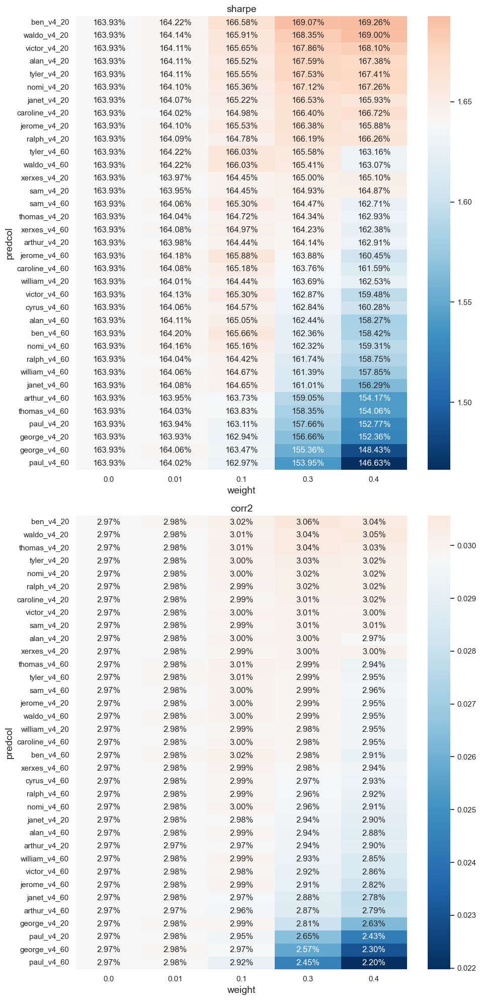

In [52]:
plot_hmap(metric_to_mat)

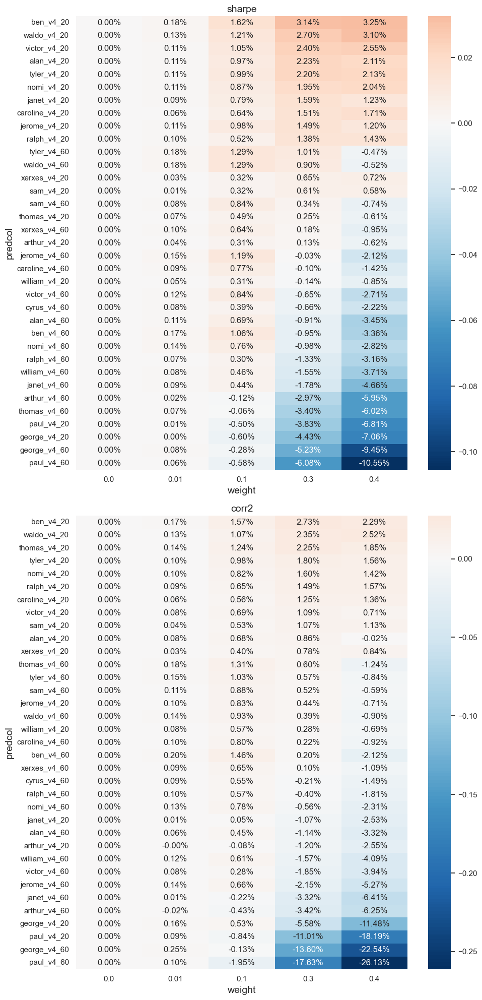

In [29]:
plot_hmap(metric_prop_diff_to_mat)

In [114]:
for metric in ["sharpe", "corr2"]:
    layout = go.Layout(
        width=800,
        height=600,
        title=f"Δ{metric}% when adding a predcol at different weights",
        xaxis_title="weights",
        yaxis_title=f"Δ{metric}%",
    )
    fig = (
        pd.DataFrame(
            metric_prop_diff_to_mat[metric]*100,
            index=PREDCOL_SHORTER_NAMES,
            columns=WTS[:,0],
        )
        .transpose()
        .iplot(
            kind='line',
            
            asFigure=True,
            layout=layout,
            
            
        )
    )
    fig.add_hline(y=0, line_dash="dash",
              annotation_text="Baseline with only cyrus", 
              annotation_position="bottom left",
              annotation_font_size=20,
              annotation_font_color="black",
    )
    fig.show()

## 5. Hand selecting 6 additional targets that seems to perform well on both corr2 and sharpe

Chosen ones `ben_20`, `waldo_20`, `caroline_20`, `tyler_20`, `nomi_20` and `victor_20`. For all of them we will use a **weight of 0.3**.

### 5.1 Predict weighted combination

#### 5.1.1 Combine all 3 cv val+test df as we are going to plot erawise predictions together

In [130]:
cv_valtest_dfs = []
for vt_dfs in cv_valpreds["cv_to_val_test_map"]:
    for split in ["val", "test"]:
        _df = vt_dfs[split].copy()
        _df.rename(
            columns={
                c: c[:-4]
                for c in _df.columns
                if c.startswith("pred_target_")
            },
            inplace=True,
        )
        cv_valtest_dfs.append(_df)
combined_test_df = pd.concat(objs=cv_valtest_dfs, axis=0,)
log.info(f"{combined_test_df.shape=}")
combined_test_df.head()

[2023-05-01 07:36:55]  combined_test_df.shape=(3328670, 84)


,target,target_nomi_v4_20,target_nomi_v4_60,target_tyler_v4_20,target_tyler_v4_60,target_victor_v4_20,target_victor_v4_60,target_ralph_v4_20,target_ralph_v4_60,target_waldo_v4_20,...,pred_target_william_v4_60,ensemble_allpreds_mean_cv0,ensemble_top8preds_mean_cv0,ensemble_cyrus_only_cv0,ensemble_allpreds_mean_cv1,ensemble_top8preds_mean_cv1,ensemble_cyrus_only_cv1,ensemble_allpreds_mean_cv2,ensemble_top8preds_mean_cv2,ensemble_cyrus_only_cv2
id,,,,,,,,,,,,,,,,,,,,,
n001f768affa1cc2,1.0,1.0,0.75,0.75,0.75,1.0,0.75,1.0,0.75,1.0,...,0.476133,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
n002cc5b29f8705f,0.5,0.5,0.50,0.25,0.50,0.5,0.50,0.5,0.50,0.5,...,0.507437,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
n00361f031876c68,0.5,0.5,0.50,0.50,0.50,0.5,0.50,0.5,0.50,0.5,...,0.479478,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
n00385e672d049e6,0.0,0.0,0.25,0.25,0.50,0.0,0.25,0.0,0.25,0.0,...,0.498582,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
n00503d13b28d441,0.5,0.5,0.50,0.50,0.25,0.5,0.50,0.5,0.50,0.5,...,0.513035,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [131]:
# check with one of the targets that it's always present
log.info(f"{combined_test_df['pred_target_waldo_v4_20'].isna().sum()=}")
combined_test_df["pred_target_waldo_v4_20"].describe().to_frame().style.format("{:.2f}")

[2023-05-01 07:37:00]  combined_test_df['pred_target_waldo_v4_20'].isna().sum()=0


,pred_target_waldo_v4_20
count,3328670.00
mean,0.50
std,0.02
min,0.38
25%,0.49
50%,0.50
75%,0.51
max,0.63


In [132]:
del cv_valtest_dfs
gc.collect()

51622

#### 5.1.2 Plot test eras in combined df

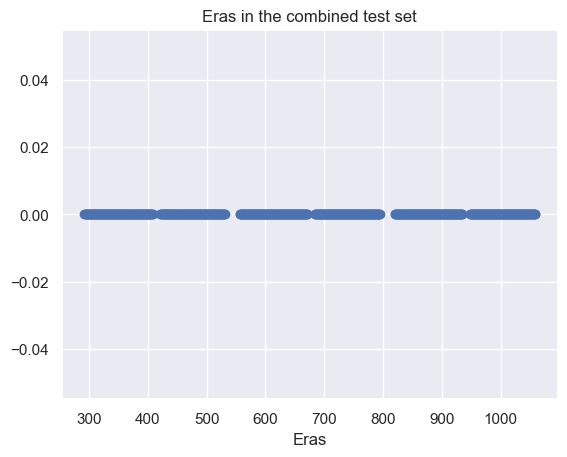

In [133]:
cmb_test_uniq_eras = combined_test_df[ERA_COL].unique()
plt.scatter(cmb_test_uniq_eras, y=[0]*len(cmb_test_uniq_eras))
plt.title("Eras in the combined test set")
plt.xlabel("Eras");

In [89]:
BASELINE_TGT_COL = "pred_target_cyrus_v4_20"

In [90]:
def predict_wtd_combination(df, paircols, wts, target_col=TARGET_COL, baseline_tgt_col=BASELINE_TGT_COL):
    ensmbl_cols = []
    pred_df = pd.DataFrame(index=df.index)
    for paircol in paircols:
        # add era col, baseline col and target col
        pred_df.loc[:, ERA_COL] = df[ERA_COL]
        pred_df.loc[:, baseline_tgt_col] = df[baseline_tgt_col]
        pred_df.loc[:, target_col] = df[target_col]
        # make wtd comb prediction
        pcols = [paircol, baseline_tgt_col]
        ensmbl_col = f"ens_{paircol}_wt{wts[0]}"
        pred_df.loc[:, ensmbl_col] = df[pcols].values @ wts
        ensmbl_cols.append(ensmbl_col)
    pred_df = pred_df[~pred_df[target_col].isna()]
    return pred_df, ensmbl_cols

In [99]:
wtd_cmb_pred_df, ensmbl_cols = predict_wtd_combination(
    df=combined_test_df,
    paircols=[
        "pred_target_ben_v4_20",
        "pred_target_waldo_v4_20",
        "pred_target_tyler_v4_20",
        "pred_target_nomi_v4_20",
        "pred_target_victor_v4_20",
        "pred_target_alan_v4_20",
    ],
    wts=np.array([0.3, 0.7]),
)

In [100]:
wtd_cmb_pred_df

,era,pred_target_cyrus_v4_20,target_cyrus_v4_20,ens_pred_target_ben_v4_20_wt0.3,ens_pred_target_waldo_v4_20_wt0.3,ens_pred_target_tyler_v4_20_wt0.3,ens_pred_target_nomi_v4_20_wt0.3,ens_pred_target_victor_v4_20_wt0.3,ens_pred_target_alan_v4_20_wt0.3
id,,,,,,,,,
n001f768affa1cc2,820,0.506688,1.00,0.502864,0.505273,0.506276,0.503157,0.503624,0.503040
n002cc5b29f8705f,820,0.493007,0.50,0.493718,0.496576,0.494581,0.491865,0.493385,0.493958
n00361f031876c68,820,0.484418,0.50,0.485568,0.485384,0.488631,0.485425,0.485657,0.487067
n00385e672d049e6,820,0.487811,0.00,0.489010,0.489252,0.487170,0.482890,0.490424,0.494894
n00503d13b28d441,820,0.526851,0.75,0.526136,0.529705,0.525111,0.528202,0.529595,0.528730
...,...,...,...,...,...,...,...,...,...
nffc14e08a58d0d3,531,0.555518,0.50,0.555323,0.558801,0.554084,0.559283,0.556021,0.556025
nffc628282dc8c05,531,0.473636,0.75,0.471297,0.476960,0.472143,0.471298,0.475417,0.479851
nffd0afc1826e574,531,0.485911,0.50,0.490222,0.495250,0.492725,0.491939,0.482950,0.482195


In [101]:
wtd_cmb_pred_df.describe().transpose().style.format("{:.3f}")

,count,mean,std,min,25%,50%,75%,max
era,3303196.000,687.527,223.071,292.000,491.000,698.000,884.000,1054.000
pred_target_cyrus_v4_20,3303196.000,0.500,0.020,0.341,0.488,0.500,0.512,0.680
target_cyrus_v4_20,3303196.000,0.500,0.223,0.000,0.250,0.500,0.750,1.000
ens_pred_target_ben_v4_20_wt0.3,3303196.000,0.500,0.019,0.356,0.488,0.500,0.512,0.652
ens_pred_target_waldo_v4_20_wt0.3,3303196.000,0.500,0.020,0.358,0.488,0.500,0.512,0.658
ens_pred_target_tyler_v4_20_wt0.3,3303196.000,0.500,0.019,0.350,0.488,0.500,0.512,0.655
ens_pred_target_nomi_v4_20_wt0.3,3303196.000,0.500,0.020,0.338,0.488,0.500,0.512,0.697
ens_pred_target_victor_v4_20_wt0.3,3303196.000,0.500,0.019,0.340,0.488,0.500,0.511,0.685
ens_pred_target_alan_v4_20_wt0.3,3303196.000,0.500,0.018,0.364,0.489,0.500,0.510,0.664


['ens_pred_target_ben_v4_20_wt0.3', 'ens_pred_target_waldo_v4_20_wt0.3', 'ens_pred_target_tyler_v4_20_wt0.3', 'ens_pred_target_nomi_v4_20_wt0.3', 'ens_pred_target_victor_v4_20_wt0.3', 'ens_pred_target_alan_v4_20_wt0.3']


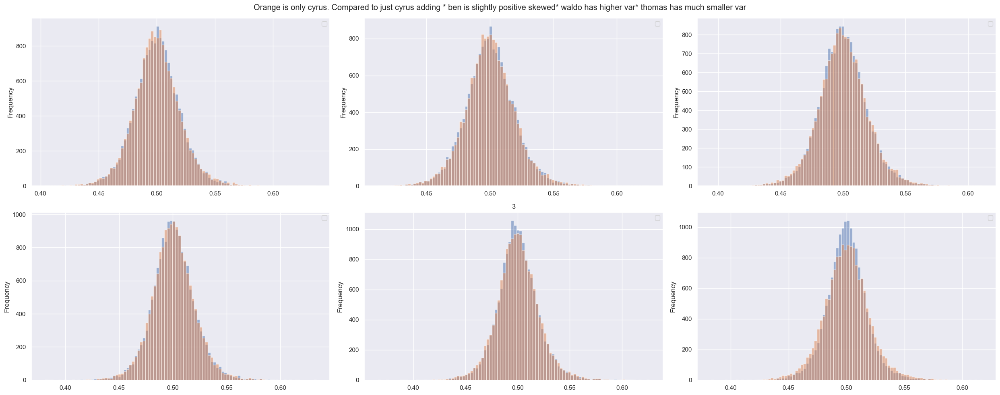

In [102]:
ens_cols = [c for c in wtd_cmb_pred_df.columns if c.startswith("ens")]
print(ens_cols)
fig, axes = plt.subplots(2, len(ens_cols)//2, figsize=(25,10))
for ax, c in zip(axes.flat, ens_cols):
    wtd_cmb_pred_df[[c, BASELINE_TGT_COL]].sample(frac=0.005).plot.hist(
        ax=ax,
        bins=100,
        alpha=0.5,
    )
    ax.legend([])
    ax.set_title(f"{c[33:]}")
plt.suptitle(
    "Orange is only cyrus. "
    "Compared to just cyrus adding "
    "* ben is slightly positive skewed"
    "* waldo has higher var"
    "* thomas has much smaller var"
);
plt.tight_layout()

In [237]:
fig = wtd_cmb_pred_df[[c for c in wtd_cmb_pred_df if c not in {"era", "target_cyrus_v4_20"}]].sample(frac=0.005).iplot(
    kind="hist",
    bins=100,
    asFigure=True,
)
fig

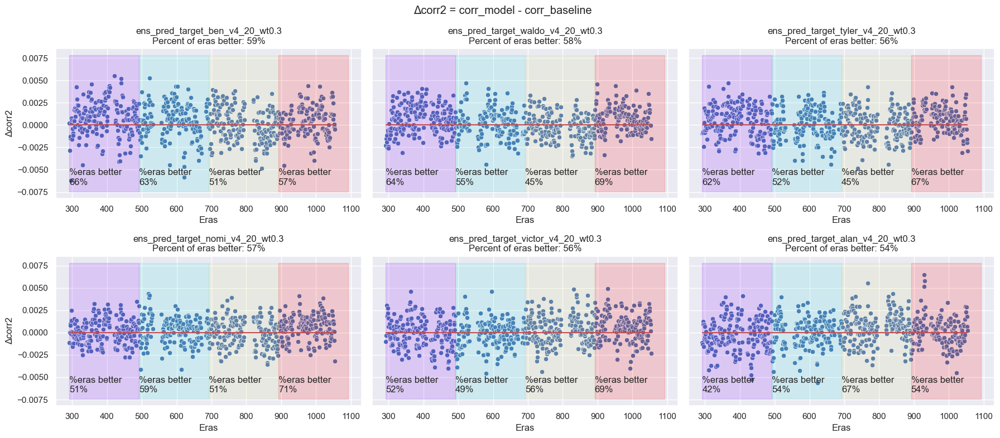

In [238]:
fig, summary_df = ut.compare_models_with_baseline(
    df=wtd_cmb_pred_df,
    predcols=ens_cols,
    baseline_col=BASELINE_TGT_COL,
    target_col=TARGET_COL,
)

In [239]:
summary_df.style.set_table_styles(ut.DF_STYLE).bar(subset=['Δcorr2%', "Δsharpe%"], color="lightblue")

,corr2,sharpe,Δcorr2%,Δsharpe%,#eras_better,#percent_eras_better,worst_corr_era / baseline_worst (< 0 better)
model,,,,,,,
pred_target_cyrus_v4_20,0.029787,1.558227,0.000000,0.000000,0,0.000000,1.000000
ben_v4_20_wt0.3,0.030605,1.602451,2.746260,2.838107,404,59.499264,1.002144
waldo_v4_20_wt0.3,0.030485,1.594002,2.345382,2.295875,393,57.879234,0.999723
tyler_v4_20_wt0.3,0.030322,1.584623,1.797470,1.694007,382,56.259205,0.995670
nomi_v4_20_wt0.3,0.030261,1.578413,1.593564,1.295462,390,57.437408,0.998076
victor_v4_20_wt0.3,0.030106,1.598479,1.071261,2.583194,380,55.964654,1.002360
alan_v4_20_wt0.3,0.030038,1.589235,0.844942,1.989967,366,53.902798,0.998492


### Regress for weights on the top 5 features based on `sharpe`
We will skip `alan_v4_20` and `nomi_v4_20`.

- `cyrus_v4_20`
- `ben_v4_20`
- `waldo_v4_20`
- `tyler_v4_20`
- `victor_v4_20`

##### Remove nan target rows

In [176]:
cmb_test_no_na_df = combined_test_df.copy()
cmb_test_no_na_df = cmb_test_no_na_df[~cmb_test_no_na_df[TARGET_COL].isna()]

In [241]:
log.info(f"Train info: {cmb_test_no_na_df.shape=}, {cmb_test_no_na_df.era.nunique()=}, {cmb_test_no_na_df.era.min()=}, {cmb_test_no_na_df.era.max()=}")

[2023-05-01 09:50:06]  Train info: cmb_test_no_na_df.shape=(3303196, 84), cmb_test_no_na_df.era.nunique()=679, cmb_test_no_na_df.era.min()=292, cmb_test_no_na_df.era.max()=1054


In [411]:
chosen_predcols = [
    'pred_target_cyrus_v4_20',
    'pred_target_ben_v4_20',
    'pred_target_waldo_v4_20',
    'pred_target_tyler_v4_20',
    'pred_target_victor_v4_20',
    'pred_target_nomi_v4_20',
]
X_test = cmb_test_no_na_df[chosen_predcols]
target = cmb_test_no_na_df[TARGET_COL]
print(TARGET_COL)

target_cyrus_v4_20


In [412]:
gc.collect()

17059

In [413]:
# Linear regression: (X'X)^-1 X' y
weighting = np.linalg.inv(X_test.T@X_test)@X_test.T@target

In [414]:
ut.fmt_metrics_df(pd.DataFrame({"predcol": chosen_predcols, "weight": weighting}).set_index("predcol"))

,weight
predcol,
pred_target_cyrus_v4_20,43.94%
pred_target_ben_v4_20,17.55%
pred_target_waldo_v4_20,11.10%
pred_target_tyler_v4_20,30.76%
pred_target_victor_v4_20,25.25%
pred_target_nomi_v4_20,-28.70%


### Regression overfits, simply set the weight of cyrus to 0.7 and redistribute 0.3 amongst the other predcols added.

In [415]:
reweighting = weighting.copy()
cyrus_wt = 0.7
reweighting[0] = cyrus_wt
reweighting[1:] = (1-cyrus_wt) /len(reweighting[1:])
ut.fmt_metrics_df(pd.DataFrame({"predcol": chosen_predcols, "weight": reweighting}).set_index("predcol"))

,weight
predcol,
pred_target_cyrus_v4_20,70.00%
pred_target_ben_v4_20,6.00%
pred_target_waldo_v4_20,6.00%
pred_target_tyler_v4_20,6.00%
pred_target_victor_v4_20,6.00%
pred_target_nomi_v4_20,6.00%


## In sample metrics by ensembling multiple targets

In [418]:
wtd_cmb_pred_df["pred_target_ens_multi"] = cmb_test_no_na_df[chosen_predcols].values @ reweighting

,corr2,sharpe,Δcorr2%,Δsharpe%,#eras_better,#percent_eras_better,worst_corr_era / baseline_worst (< 0 better)
model,,,,,,,
pred_target_cyrus_v4_20,0.029787,1.558227,0.000000,0.000000,0,0.000000,1.000000
ens_multi,0.030601,1.598891,2.731947,2.609681,438,64.506627,0.999518
ben_v4_20_wt0.3,0.030605,1.602451,2.746260,2.838107,404,59.499264,1.002144


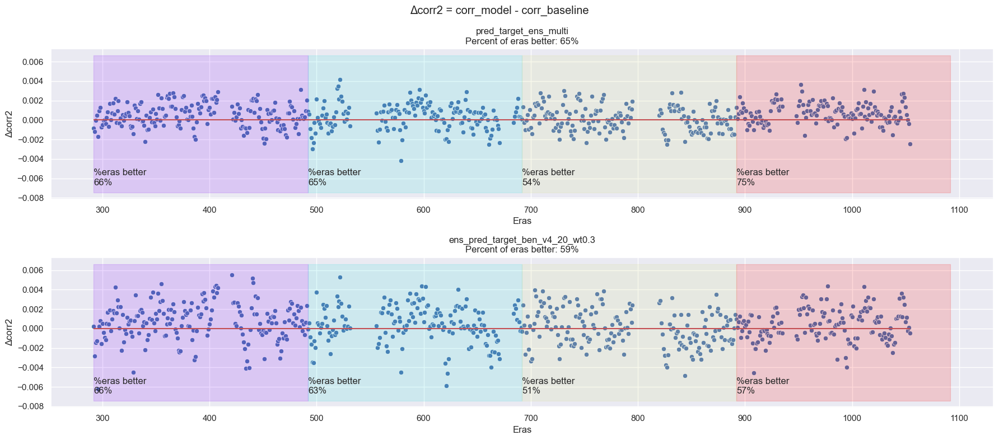

In [419]:
fig, summary_df = ut.compare_models_with_baseline(
    df=wtd_cmb_pred_df,
    predcols=["pred_target_ens_multi", "ens_pred_target_ben_v4_20_wt0.3"],
    baseline_col=BASELINE_TGT_COL,
    target_col=TARGET_COL,
)
display(summary_df.style.set_table_styles(ut.DF_STYLE).bar(subset=['Δcorr2%', "Δsharpe%"], color="lightblue"))